### Dart Detection
###### This is an exercise in using OpenCV 3.2 and python3 to detect darts thrown on a dart board using image processing

In [1]:
%matplotlib inline
import cv2
from matplotlib import pyplot as plt
import numpy as np
import time as t
print("OpenCV Version : %s " % cv2.__version__)

OpenCV Version : 3.2.0-dev 


In [2]:
ls samples

1arrowtest.jpg    IMG_0010.JPG*     PKMN6853.MOV      arrow.png
AAEO2187.MOV      IMG_3656.JPG      RXVX4887.MOV      board-arrow1.JPG
IMG_0008.JPG*     IMG_3674.JPG      TSLW0958.MOV      board.JPG
IMG_0009.JPG*     LGZT7865.MOV      WNZE0063.MOV


In [3]:
PATH = r'samples/board.JPG'
image = cv2.imread(PATH,cv2.IMREAD_COLOR)

Now matplotlib expects images as RGB, while OpenCV reads them as BGR. 
As a results we are switchingn the channels and render the images as a test.

In [4]:
b,g,r = cv2.split(image)
image2 = cv2.merge([r,g,b])

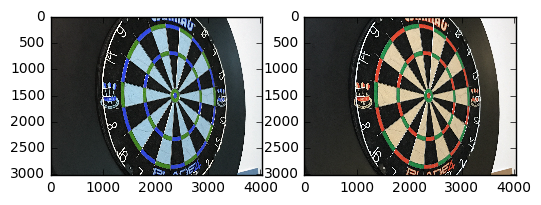

In [5]:
plt.subplot(121);plt.imshow(image)
plt.subplot(122);plt.imshow(image2)
plt.show()

Now let's define a function that takes care of the plotting with conversion if required for us - and also plot a bit bigger.

In [6]:
def convertToRgb(im):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

def plot(im, convert=False):
    fig, ax = plt.subplots(figsize=(25, 25))
    if convert:
        ax.imshow(convertToRgb(im))
    else:
        ax.imshow(im)

Now let's load a 4K video and get a frame from it so we have our first arrow - and take another frame for background subtraction.

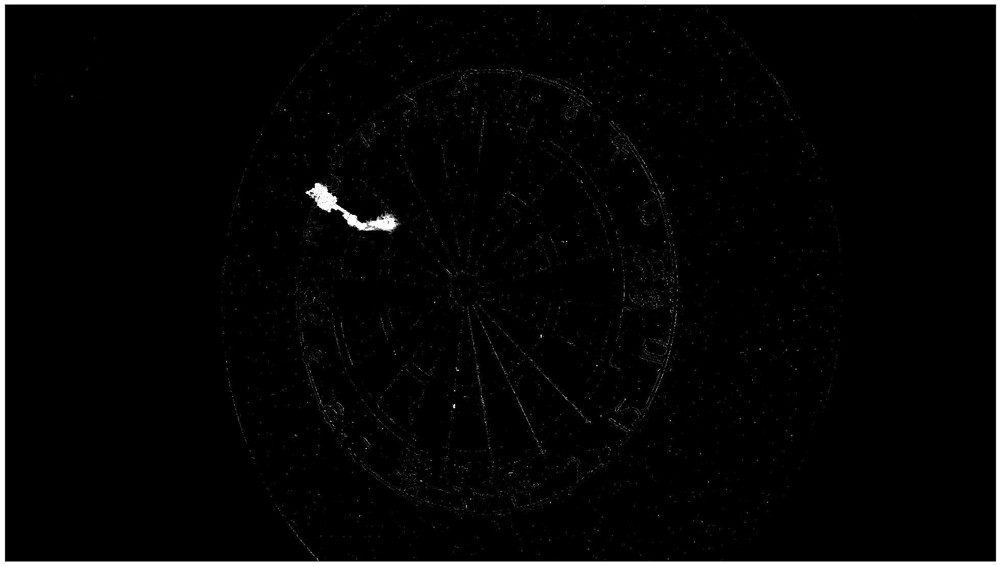

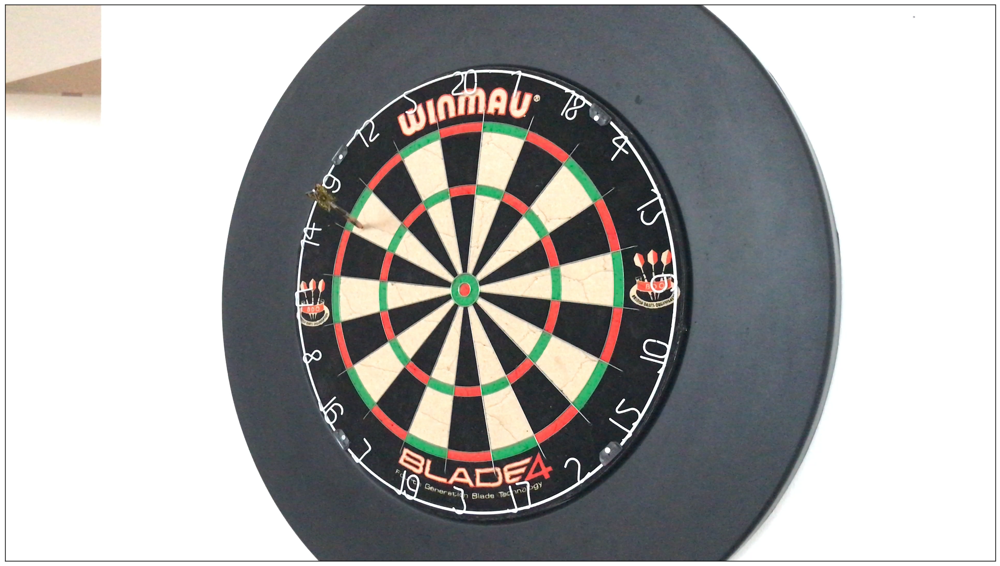

In [7]:
cap = cv2.VideoCapture('samples/AAEO2187.MOV')
i=0
fgbg = cv2.createBackgroundSubtractorMOG2()

fgbg.setDetectShadows(1)
fgbg.setShadowThreshold(0.5)

while(i<14):
    ret, frame = cap.read()
    fgmask = fgbg.apply(frame)
    i=i+1

#read next frame for arrow to not have motion blur 
ret, frame = cap.read()    
cap.release()


background = fgbg.getBackgroundImage()
plt.subplots(figsize=(25,25))
plt.xticks([]);plt.yticks([]);plt.imshow(fgmask,cmap='gray')
plt.show()
plt.subplots(figsize=(25,25))
plt.xticks([]);plt.yticks([]);plt.imshow(convertToRgb(frame))
plt.show()

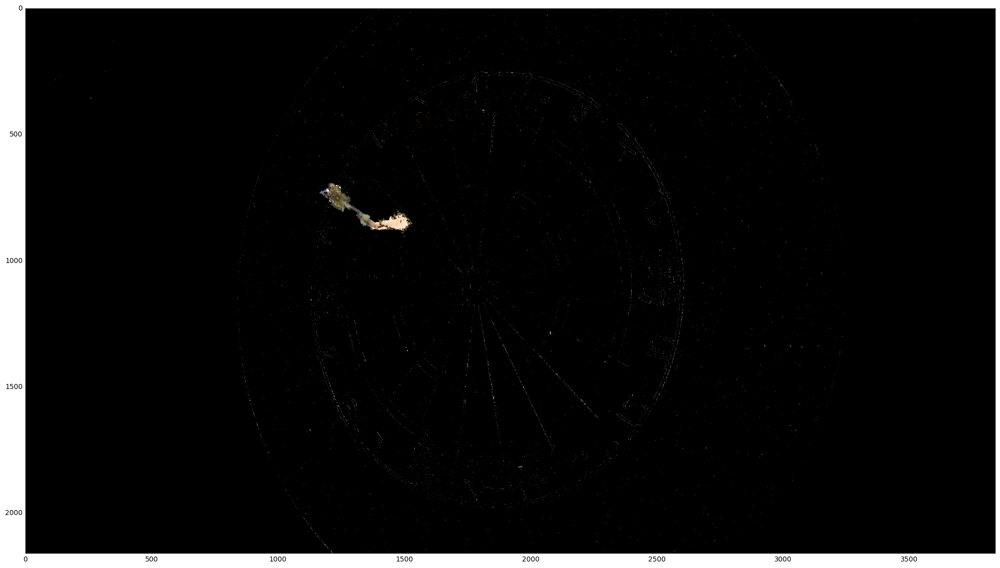

In [8]:
#maybe rather bitwise_and 

arrowmask = cv2.merge([fgmask,fgmask,fgmask])
targetim = arrowmask.copy()
ret = cv2.bitwise_and(frame,targetim, arrowmask)
plot(arrowmask,1)

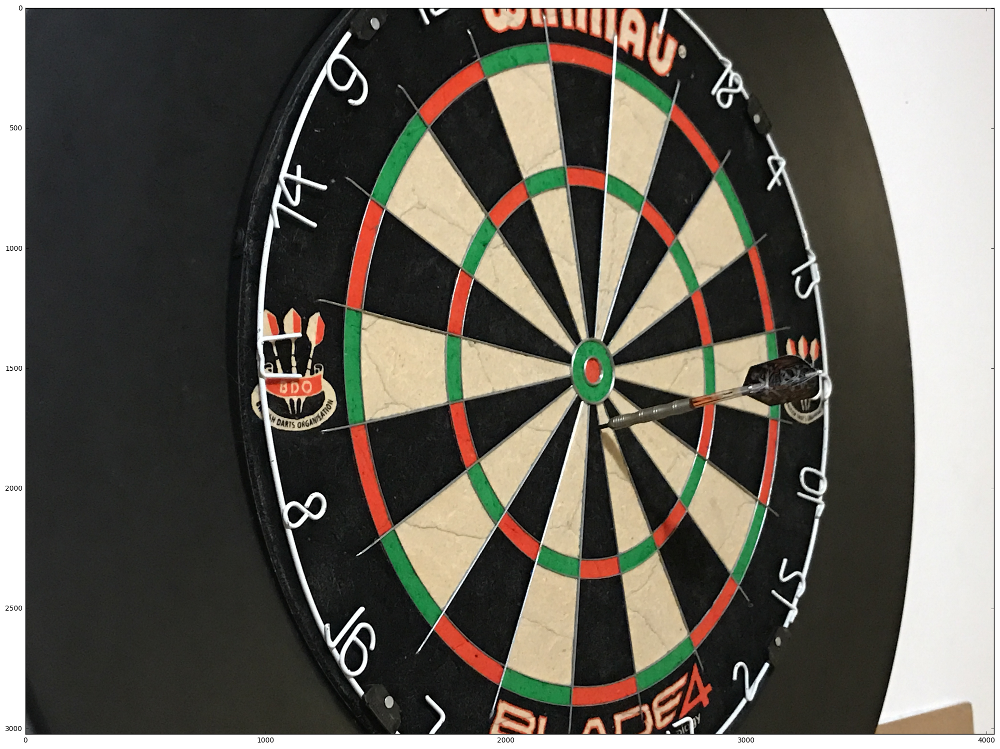

In [9]:
# alright - video is despite 4K still a bit low-res, let's try pictures insteads
arrowimg = cv2.imread('samples/board-arrow1.JPG',cv2.IMREAD_COLOR)
plot(arrowimg,1)

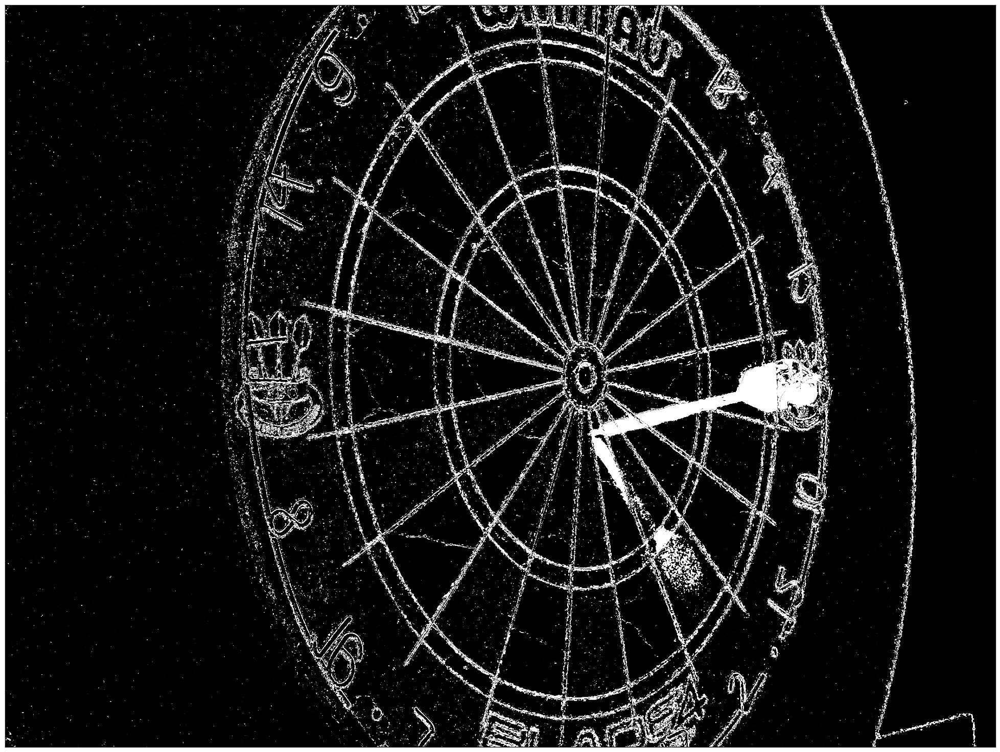

In [10]:
#same background subtraction - let's see if we can find motion between those pictures: 
fg2 = cv2.createBackgroundSubtractorMOG2()
fg2.setDetectShadows(0)

fg2mask = fg2.apply(image) #apply background
arrowimg = cv2.imread('samples/board-arrow1.JPG',cv2.IMREAD_COLOR)
fg2mask = fg2.apply(arrowimg) #apply foreground

plt.subplots(figsize=(25,25))
plt.xticks([]);plt.yticks([]);plt.imshow(fg2mask,cmap='gray')
plt.show()

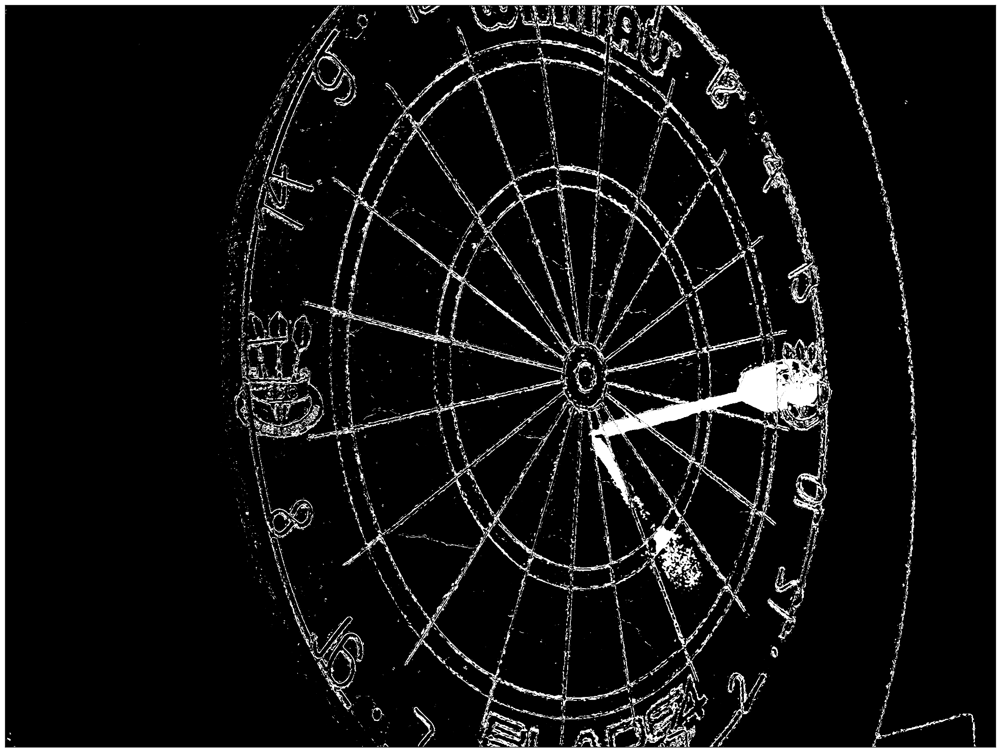

In [11]:
#uh - yuck - too much detail - photos from a tripod don't align perfectly. Maybe some blur before detecting.
blurbackground = cv2.medianBlur(image,7)
blurarrow = cv2.medianBlur(arrowimg,7)
fg3 = cv2.createBackgroundSubtractorMOG2()
fg3.setDetectShadows(0)

fg3mask = fg3.apply(blurbackground) #apply background
fg3mask = fg3.apply(blurarrow) #apply foreground

plt.subplots(figsize=(25,25))
plt.xticks([]);plt.yticks([]);plt.imshow(fg3mask,cmap='gray')
plt.show()

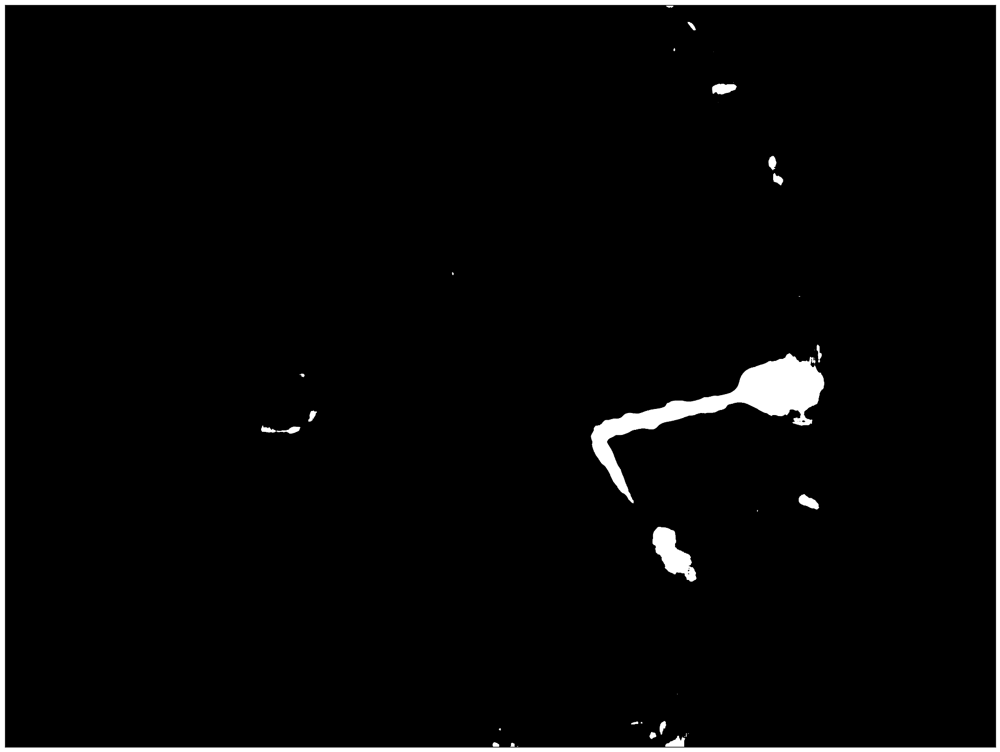

In [12]:
#does not do much - how about heavy median after detection: 
fg2median = cv2.medianBlur(fg2mask,55)
plt.subplots(figsize=(25,25))
plt.xticks([]);plt.yticks([]);plt.imshow(fg2median,cmap='gray')
plt.show()

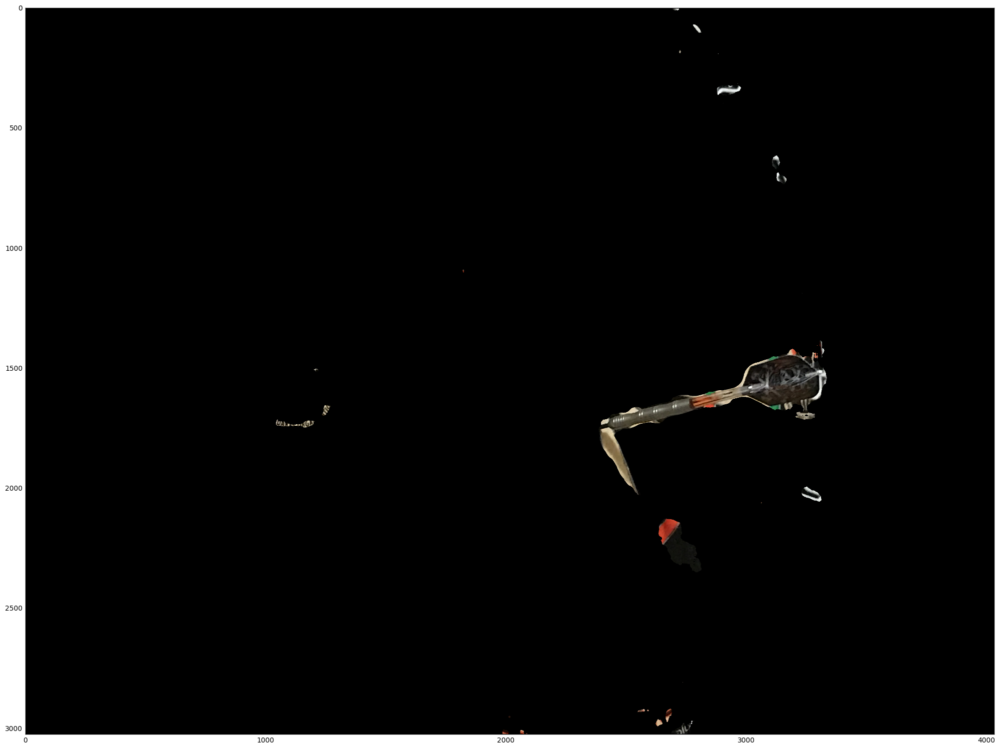

In [13]:
#damn that shadow... either way: let's use that as mask: 
arrowmask = cv2.merge([fg2median,fg2median,fg2median])
targetim = arrowmask.copy()
ret = cv2.bitwise_and(arrowimg,targetim, arrowmask)
plot(arrowmask,1)

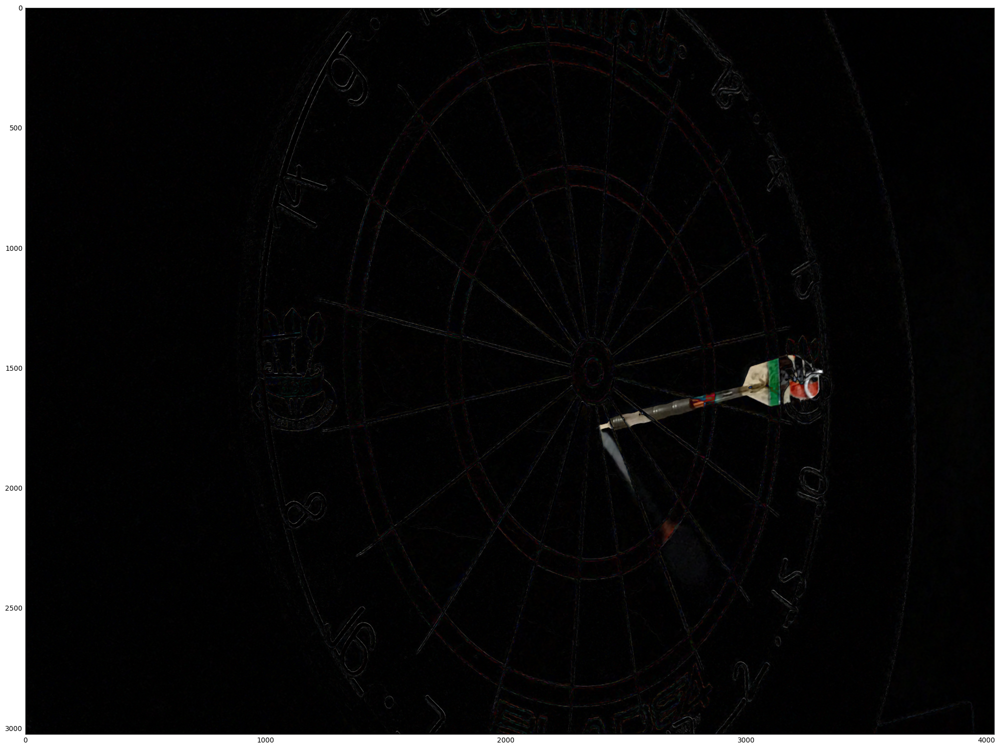

In [14]:
#does not quite look like the tip of the arrow is there. trying absdiff
diffimg = arrowimg.copy()
cv2.absdiff(blurbackground, blurarrow, diffimg)
plot(diffimg,1) #hmm - not much better... 

In [15]:
#hmm - black in black. no good.  let's get a hough-line detected through that masked arrow img.
def makeLine(im, rho, theta):
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 10000*(-b))
    y1 = int(y0 + 10000*(a))

    x2 = int(x0 - 10000*(-b))
    y2 = int(y0 - 10000*(a))
    cv2.line(im, (x1, y1), (x2, y2), (0,0,255), 1)

(270, 1, 2)


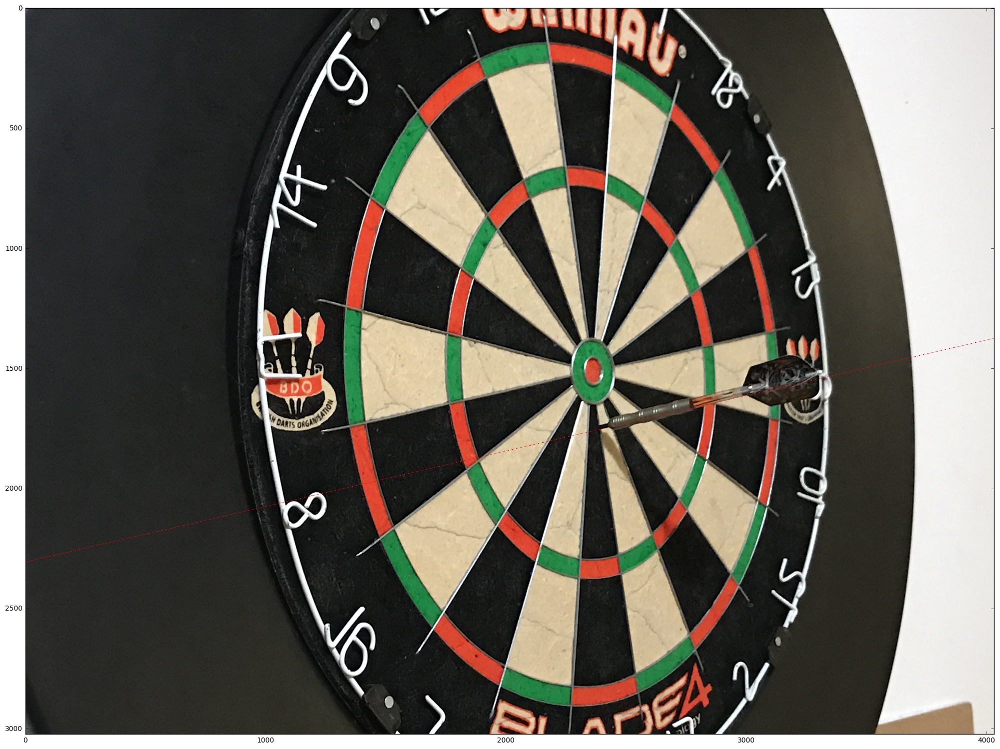

In [16]:
imageLines = arrowimg.copy()

lines = cv2.HoughLines(cv2.cvtColor(arrowmask, cv2.COLOR_BGR2GRAY), 1, np.pi /180., 500)
print (lines.shape)
makeLine(imageLines, lines[0][0][0], lines[0][0][1]) #only plot the strongest Hough Line
#makeLine(imageLines, lines[1][0][0], lines[1][0][1])

plot(imageLines,1)

In [17]:
#ok - not bad. but not good enough to examine the entrypoint to the dart-board. 
#looking for transforms of sample pictures should be much better I hope.
